### Prueba técnica - Itinerario Data Science con python.

# Notebook 2. Análisis exploratorio de los datos. 

## 1. Preparación del dataset.


En este notebook voy a hacer un análisis de los datos que hemos descargado en nuestra base de datos.

In [2]:
## Librerías

# Data wrangling
#-----------------------------------------------------------------------
import numpy as np
import pandas as pd

import missingno as msno 

import pandas_profiling as pp

## Time series
##----------------------------------------------------------------
from statsmodels.tsa.seasonal import seasonal_decompose

## Visualización de datos
##----------------------------------------------------------------
%matplotlib inline
import matplotlib.pyplot as plt

import seaborn as sns


# MySQL conection
#-----------------------------------------------------------------------
import mysql.connector




In [3]:
# Seaborn settings
sns.set_style("darkgrid")
sns.set_palette('RdGy')


En primer lugar voy a cargar los datos de la base de datos MySQL y los introduciré en un dataframe, para a continuación darle formato y preprocesar el dataset. 

### 1.1. Carga de los datos.

Cargamos los datos con la ayuda de la librería mysql.connector.

In [4]:
# Conection with localhost 
mydb = mysql.connector.connect(
  host='localhost',
  user='root',
  password='c4nionerou', 
  database='bcn_precipitaciones'
)

In [5]:
# Opnening a cursor
mycursor = mydb.cursor(dictionary=True)

In [6]:
# Query for extracting
query2 = '''SELECT * 
           FROM precipitaciones'''

In [7]:
mycursor.execute(query2)

In [8]:
DATA_b = mycursor.fetchall()
#DATA_b

In [9]:
DATA = pd.DataFrame(DATA_b)

In [10]:
mycursor.close()

True

In [11]:
mydb.commit()

### 1.2. Preprocesamiento del dataset.

Antes de explorar las variables tenemos que seguir los siguientes pasos:
1. Dar formato correspondiente a cada campo.
2. Búsqueda de duplicados.
3. Tratamiento de valores perdidos.


In [12]:
# First lines
DATA.head(3)

,ID,fecha,precipitacion,horas_sol,presion_max,presion_min,temperatura_min,temperatura_max,velocidad_media
0,0,1992-01-01,0.0,6.6,1037.8,1033.6,11.6,0.3,7.92
1,1,1992-01-02,0.0,6.4,1038.6,1037.0,12.6,0.2,11.16
2,2,1992-01-03,0.3,1.0,1037.3,1032.7,12.2,2.3,7.92


In [13]:
# General info 
DATA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10775 entries, 0 to 10774
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   ID               10775 non-null  int64 
 1   fecha            10775 non-null  object
 2   precipitacion    10775 non-null  object
 3   horas_sol        10775 non-null  object
 4   presion_max      10775 non-null  object
 5   presion_min      10775 non-null  object
 6   temperatura_min  10775 non-null  object
 7   temperatura_max  10775 non-null  object
 8   velocidad_media  10775 non-null  object
dtypes: int64(1), object(8)
memory usage: 757.7+ KB


In [14]:
# fecha to datetime
DATA.fecha = pd.to_datetime(DATA.fecha,format='%Y-%m-%d' )

In [15]:
columnas = DATA.columns
# columns to numeric
for campo in columnas[2:]:
    DATA[campo] = pd.to_numeric(DATA[campo])

In [16]:
# General info after formating features
DATA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10775 entries, 0 to 10774
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   ID               10775 non-null  int64         
 1   fecha            10775 non-null  datetime64[ns]
 2   precipitacion    10693 non-null  float64       
 3   horas_sol        10285 non-null  float64       
 4   presion_max      10719 non-null  float64       
 5   presion_min      10718 non-null  float64       
 6   temperatura_min  10743 non-null  float64       
 7   temperatura_max  10743 non-null  float64       
 8   velocidad_media  10775 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 757.7 KB


In [17]:
# Duplicated rows
DATA[DATA.duplicated()].sum()

ID                 0.0
precipitacion      0.0
horas_sol          0.0
presion_max        0.0
presion_min        0.0
temperatura_min    0.0
temperatura_max    0.0
velocidad_media    0.0
dtype: float64

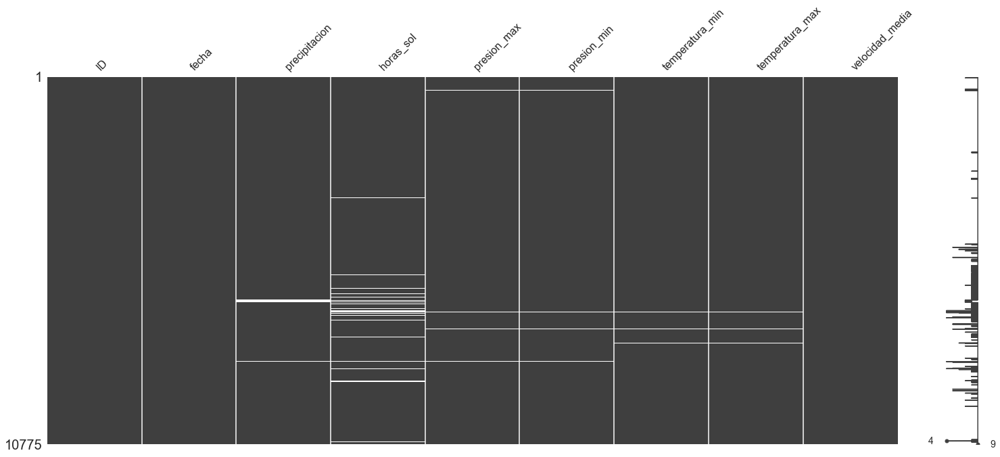

In [18]:
# Missing values
msno.matrix(DATA);

In [19]:
# Total percentage missing values 
(DATA.isna().sum()/DATA.shape[0]*100).round(2)

ID                 0.00
fecha              0.00
precipitacion      0.76
horas_sol          4.55
presion_max        0.52
presion_min        0.53
temperatura_min    0.30
temperatura_max    0.30
velocidad_media    0.00
dtype: float64

El porcentage de valores perdidos es en general inferior al 1% salvo en la variable horas de sol. Para tratar los valores perdidos voy a utilizar el siguiente enfoque:
- __precipitación__: como se trata de la variable objetivo y tenemos menos de un 1%, estos valores perdidos los voy a eliminar.

- __Resto de variables__: En este caso voy a interpolar los valores nulos, entender que el valor diario estará muy cerca del promedio de los días anterior y posterior.




In [20]:
# Dropping Missing values for target precipitacion
DATA.dropna(axis=0,
            subset=['precipitacion'], 
            inplace=True)

In [21]:
# Interpolating missing values for the other features
DATA.interpolate(inplace=True)

### 1.3. Nuevas variables.

In [22]:
# New feature mes
DATA['mes'] = DATA.fecha.dt.month

# New feature año
DATA['anio'] = DATA.fecha.dt.year


In [23]:
# New feature lluvia
DATA['lluvia'] = 'No'
DATA.loc[DATA.precipitacion > 0, 'lluvia'] = 'Si' 

## 2. Análisis exploratorio.

### 2.1. Análisis univariable.

En primer lugar quiero ver como es la distribución de las variables que componen nuestro dataset. Pandas Profilling es una librería que te permite hacer un EDA de manera rápida, generando un reporte.

In [24]:
# Genero profile report

DATA_report = pp.ProfileReport(DATA,
                               title = 'Datos metereológicos de Barcelona de 1992 a 2021',
                               explorative = True)
DATA_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
# Save to html file
DATA_report.to_file('precipitaciones.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [28]:
# Statistics values for features
DATA.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,10693.0,5375.533059,3118.866989,0.0,2673.00,5346.00,8091.0,10774.00
precipitacion,10693.0,1.518732,6.443861,0.0,0.00,0.00,0.0,134.70
horas_sol,10693.0,6.719859,3.705534,0.0,3.80,7.40,9.9,13.70
presion_max,10693.0,1018.777892,6.317483,989.9,1015.10,1018.70,1022.5,1040.90
presion_min,10693.0,1014.216520,7.166733,979.4,1010.20,1014.60,1018.6,1037.00
temperatura_min,10693.0,20.782344,5.864052,2.7,16.00,20.30,25.8,37.40
temperatura_max,10693.0,12.745553,6.211304,-3.6,7.80,12.30,18.0,27.30
velocidad_media,10693.0,15.213863,5.486014,0.0,11.88,14.04,18.0,68.04
mes,10693.0,6.474703,3.432155,1.0,4.00,6.00,9.0,12.00
anio,10693.0,2006.221734,8.541306,1992.0,1999.00,2006.00,2014.0,2021.00


A continuación voy a ver la distribución de las variables:

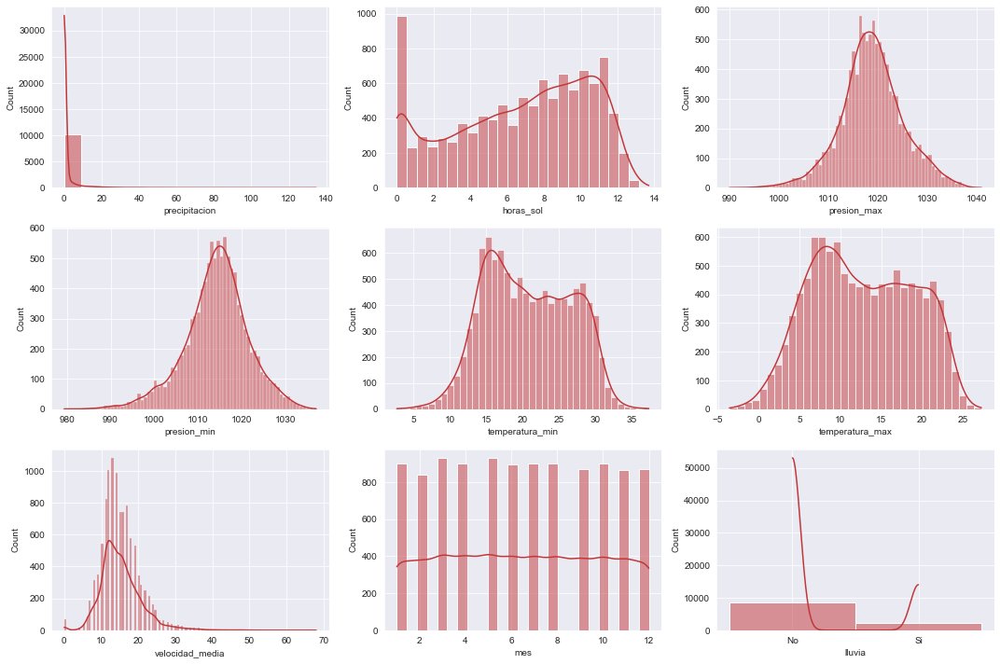

In [36]:
# Visualización Histogramas 
filas=3
columnas=3

# Creación Figuras, axes y estilo.
fig, axes = plt.subplots(filas, columnas, figsize=(15, 10),tight_layout=True)

df = DATA[(DATA.columns.to_list()[2:])]

# Plot histogramas
for i in range(filas):
    for j in range(columnas):
        var=(+j)+(i*columnas)
        sns.histplot(ax = axes[i, j], 
                     data = df,  
                     x = df.columns[var],
                     kde = True,
                     alpha = 0.5)
        

Se puede apreciar que las presiones y la velocidad media del viento tienen distribuciones normales, las temperaturas siguen una distribución que se puede asimilar con una distribución bimodal.

Tan solo llovió un 20% de los días.

### 2.2. Análisis multivariable.

### 2.2.1. Correlación de variables.

Veamos a continuación como está correlacionadas las variables:

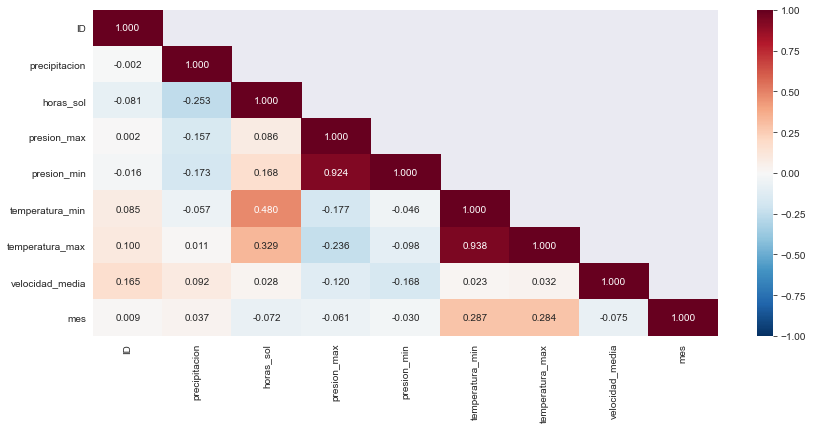

In [37]:
# Correlation matrix
#---------------------------------------------------------------------------
fig, axes = plt.subplots(figsize=(14, 6))

sns.heatmap(DATA.corr(),
           vmin=-1.0,
           vmax=1.0,
           annot=True, fmt='.3f',
           mask=np.tri(len(DATA.corr()),len(DATA.corr()),k=-1,dtype=bool).T,
           cmap='RdBu_r');

Las variables más correlacionadas son:
- Presión máxima y presión mínima (0.938)
- Temperatura máxima y temperatura mínima (0.924)

Además con una correlación media tenemos:
- Horas de sol con temperaturas (entre 0.48 y 0.33)
- Mes con temperaturas (0.28)

La precipitación tiene una correlación negativa media-baja con horas de sol (-0.25)

### 2.2.2. Visualización de las relaciones entre variables.



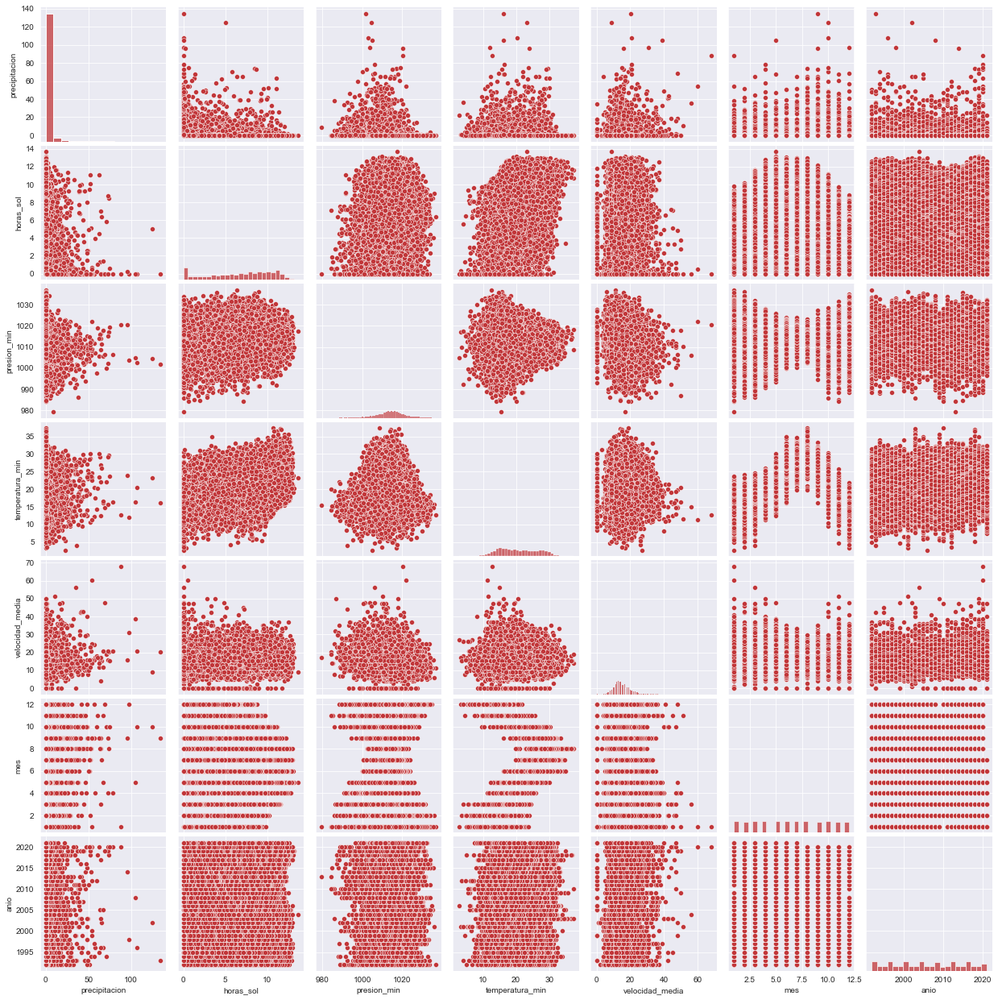

In [120]:
sns.pairplot(DATA[['precipitacion',
                   'horas_sol',
                   'presion_min',
                   'temperatura_min',
                   'velocidad_media',
                   'mes',
                   'anio']]);

En este conjunto de gráficas se puede observar:
- Las temperaturas tienden a ser mayores cuando hay más horas de insolación.
- Junio, julio, agosto y septiembre son los meses más calurosos.

Veamos como se distribuyen las variables en función de si hubo lluvia o no y si existe alguna tendencia clara:

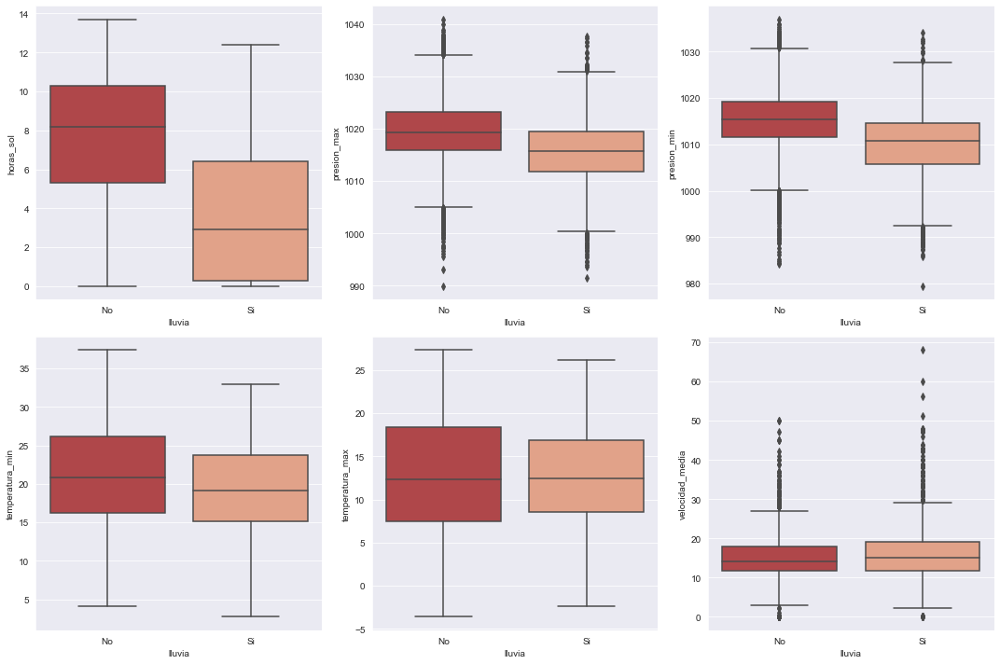

In [113]:
#sns.boxplot(df)
filas=2
columnas=3

# Figs, axes.
fig, axes = plt.subplots(filas, columnas, figsize=(15, 10),tight_layout=True)


# Plot histogramas
for i in range(filas):
    for j in range(columnas):
        var=(+j+1)+(i*columnas)
        sns.boxplot(ax = axes[i, j], 
                     data = DATA,  
                     y = df.columns[var],
                     x = 'lluvia')

De las visualizaciones anteriores podemos observar:

- Existe una tendencia a menor número de horas de insolación los días que hay lluvia.
- Las presiones tienden a ser menores en días con lluvia.
- Respecto a temperaturas y velocidad del viento no se observan patrones claros.

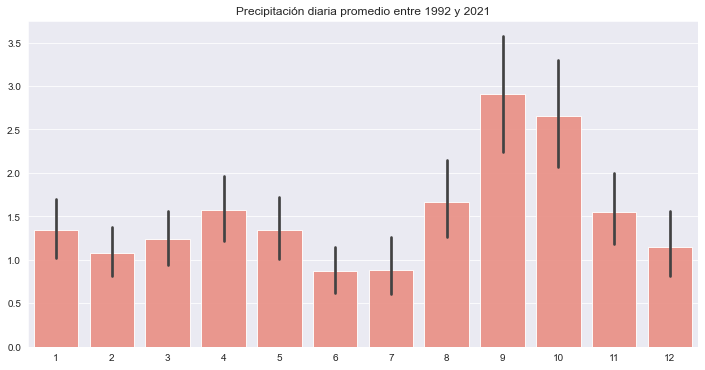

In [73]:
# Precipitaciones por mes / año

# fig y axes.
fig, (ax1) = plt.subplots(figsize=(12, 6))

# Plot
sns.barplot(data=DATA,
            y='precipitacion',
            x=DATA.mes,#.astype(str),
            estimator=np.mean,
            alpha=0.9,
            ax=ax1,
            color='salmon',
            )

# Settings 
ax1.set(title='Precipitación diaria promedio entre 1992 y 2021',
       ylabel=None,
       xlabel=None);



Se observa que en los últimos veintinueve años septiembre y octubre son los meses más lluviosos con una media de precipitación diaria de entre 2,6 y 2,9 litros/m2. Y los meses más secos junio y julio.

Hasta ahora hemos analizado la relaciones entre variables sin tener en cuenta la relación de temporalidad que existe entre todo el conjunto de datos. 

Hemos visto como existen determinados meses del año donde hay mayor promedio de precipitaciones y como existe una relación entre las horas de sol (insolación) o la presión atmosférica con la precipitación.

En el siguiente apartado vamos a analizar el dataset desde el enfoque de una serie temporal.


### 2.2.3. Análisis de la serie temporal.

Un serie temporal es un conjunto de datos tomados en el tiempo. Donde se cumplen las siguientes características:
- Las observaciones se realizan en intervalos de tiempo iguales entre sí.
- Las observaciones sucesivas no son independientes entre sí y el análisis debe llevarse a cabo teniendo en cuenta el orden temporal de las observaciones.


Para el análisis de la serie temporal vamos a agrupar los datos por meses. Teniendo en cuenta que los valores de precipitación será los acumulados mensuales, los valores de variables atmosféricas serán la media del mes y para la variable lluvia contaremos el número de días que llovió en ese mes. 

In [123]:
# Dropping ID, mes and anio
DATA.drop(columns=['ID','mes','anio'], inplace=True)

In [133]:
# fecha to index
DATA.set_index('fecha', drop=True, inplace=True)

In [143]:
# Encoding lluvia feature Si = 1 / No = 0 
lluvia_enc = {'Si':1,'No':0}
DATA.lluvia = DATA.lluvia.map(lluvia_enc)

In [150]:
ST_MES = DATA.resample('M').agg({'precipitacion':'sum',
                                 'horas_sol': 'mean',
                                 'presion_max': 'mean',
                                 'presion_min': 'mean',
                                 'temperatura_min':'mean',
                                 'temperatura_max':'mean',
                                 'velocidad_media':'mean',
                                 'lluvia':'sum'
                                 })

In [153]:
# Dropping last row, july 2021
ST_MES = ST_MES[0:-1]

Veamos por ejemplo la línea temporal de los últimos 5 años.

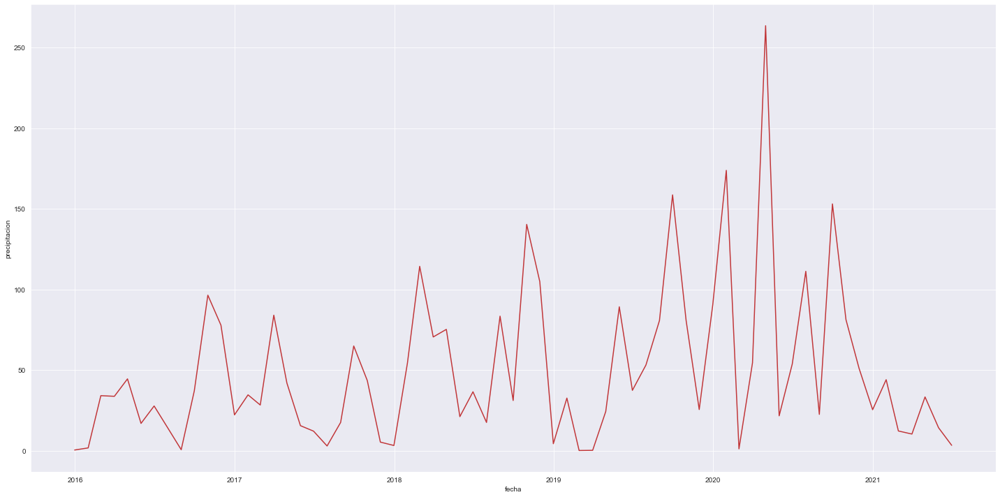

In [172]:
fig, axes = plt.subplots(figsize=(20, 10),tight_layout=True)

sns.lineplot(data=ST_MES.reset_index()[-67:],
             y='precipitacion',
             x='fecha');

Parce que existe cienta estacionalidad en las precipitaciones acumuladas por mes. Los meses de marzo, abril y mayo suelen tener valores acumulados de precipitaciones, a continuación le siguen meses más secos y de nuevo septiembre, octubre y noviembre aumenta el volumen de precipitaciones total.

#### 2.2.3.1. Descomposición de la serie temporal.

Las series temporales se pueden descomponer en tres factores o componentes:

- Tendencia: Comportamiento global de la serie a largo plazo respecto del valor medio.

- Estacionalidad: Movimiento periódico de corto plazo. Debida a la influencia de ciertos fenómenos que se repiten de manera periódica a lo largo del tiempo.

- Residual o aletoriedad: Alteraciones de la serie producidas de manera aleatoria.

Veamos como quedaría descompuesta esta serie:

In [196]:
decomposed_ts=seasonal_decompose(ST_MES.precipitacion, model='additive', period=12)

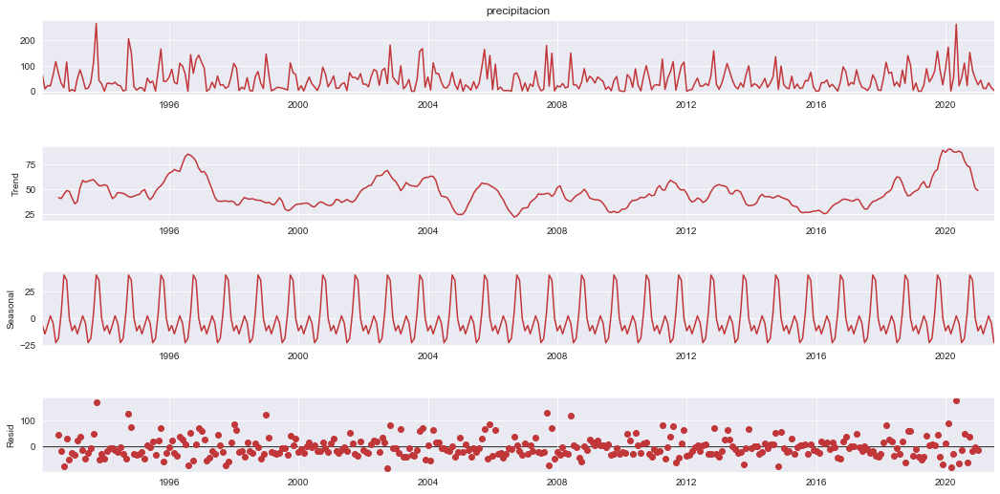

In [197]:
fig=decomposed_ts.plot()
fig.set_figheight(8)
fig.set_figwidth(16);


Observando la serie temporal completa vemos los siguiente:
- La tendencia de la serie oscila a lo largo de los años, observándose periodos donde hay una tendencia al alza de las precipitaciones acumuladas (de 1996 a 1997, de 2001 a 2003 o de 2019 a 2020) y otros donde la tendencia es descendente (de 1997 a 1998 o el actual periodo de 2020 a 2021).

- El componente estacional es muy constante, observándose un máximo de lluvias en el último trimestre del año y un mínimo sobre la mitad del año.

- La componente residual presenta mucha homogeneidad, no se observan desviaciones o tendencias dentro de la serie.

Podemos ver esta descomposión solo para los últimos cinco años:

In [208]:
decomposed_ts=seasonal_decompose(ST_MES[-66:].precipitacion, model='additive', period=12)

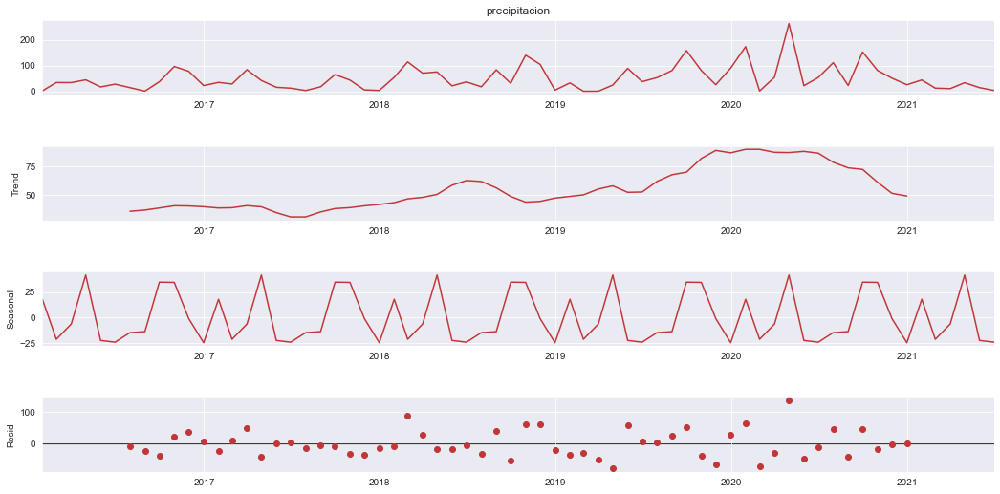

In [209]:
fig=decomposed_ts.plot()
fig.set_figheight(8)
fig.set_figwidth(16);

Descomponiendo la serie temporal para estos últimos cinco años podemos ver:
- En la estacionalidad ha habido un cambio en la ubicación del máximo. Ahora hay más tendencia a que mayo sea más lluvioso que septiembre u octubre, mientras que en años y décadas anteriores el máximo de lluvias estaba alrededor de octubre.
- De 2017 hubo un periodo de tendencia ascendente y en 2021 estamos iniciando un periodo de tendencia de menos lluvias. 